# Advanced Line Lines Project

## The steps of this project are the following:
* Load test images
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


##  Load test images

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import pickle

In [2]:
# Define a show method to display images in every step.
def imshow(images, cmap=None):
    n = 0
    if (len(images) % 2) == 0:
        n = int(len(images)/2)
    else:
        n = int(len(images)/2 + 1)
        images.append(np.ones_like(images[0])*255)
    f, axes = plt.subplots(n, 2, figsize=(24, 6*n))
    f.tight_layout()
    for i, j in enumerate(np.arange(0, len(images), 2)):
        axes[i][0].imshow(images[j], cmap=cmap)
        axes[i][0].set_axis_off()
        axes[i][1].imshow(images[j+1], cmap=cmap)
        axes[i][1].set_axis_off()

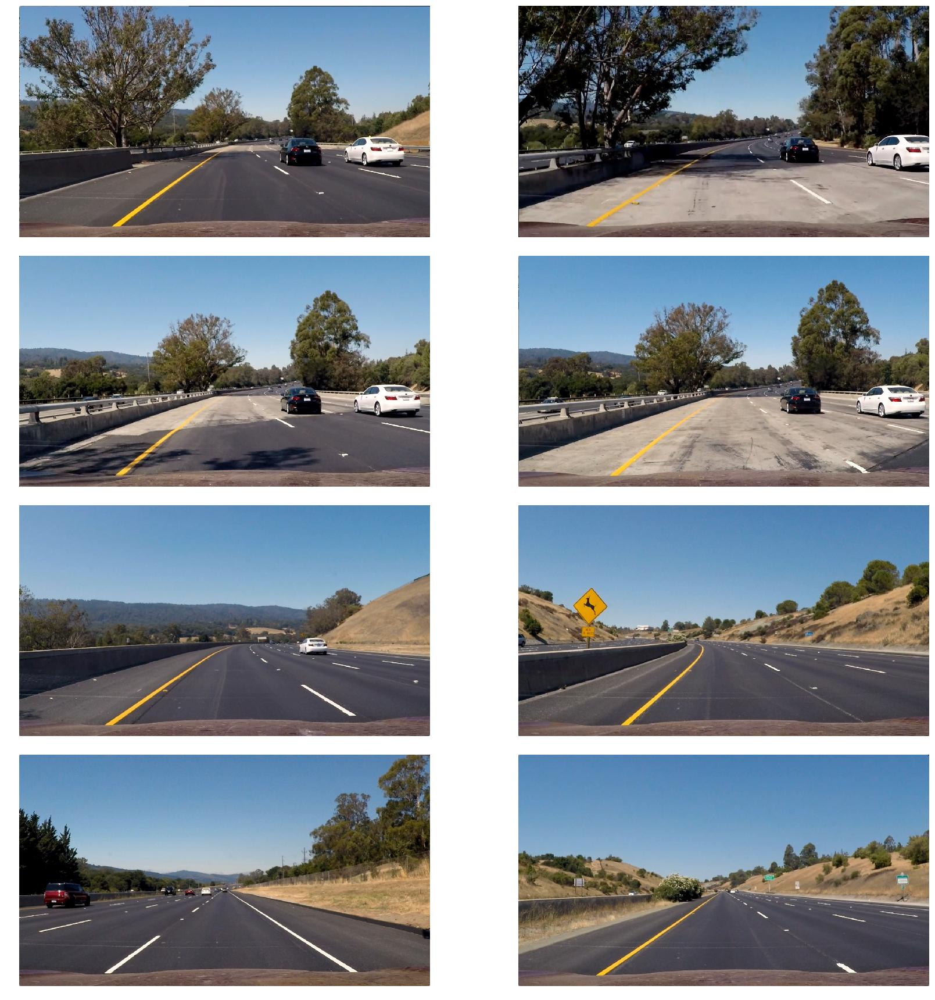

In [3]:
# Read test images
test_images_fname = glob.glob('test_images/*.jpg')
images=[]
for fname in test_images_fname:
    image = plt.imread(fname)
    images.append(image)
    
imshow(images)
plt.show()

## Camera Calibration 
I start by preparing "object points", which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image.  Thus, `objp` is just a replicated array of coordinates, and `objpoints` will be appended with a copy of it every time I successfully detect all chessboard corners in a test image.  `imgpoints` will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.  

I then used the output `objpoints` and `imgpoints` to compute the camera calibration and distortion coefficients using the `cv2.calibrateCamera()` function.  

In [4]:
def camera_calibration(camera_cal_fname, nx=9, ny=6):
    """
    Input
    camera_cal_fname: the list of file names in camera_cal document 
    nx: the number of inside corners in x
    nx: the number of inside corners in y
    
    Output
    mtx: camera matrix
    dist: distortion coefficients
    """
    objp = np.zeros((nx*ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    objps = []
    imgps = []
    for fname in camera_cal_fname:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        if ret == True:
            objps.append(objp)
            imgps.append(corners)
    img_size = (img.shape[1], img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objps, imgps, img_size, None, None)
    return mtx, dist
          
camera_cal_fname = glob.glob('camera_cal/calibration*.jpg')
mtx, dist = camera_calibration(camera_cal_fname)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("wide_dist_pickle.p", "wb"))

## Apply a distortion correction to raw images

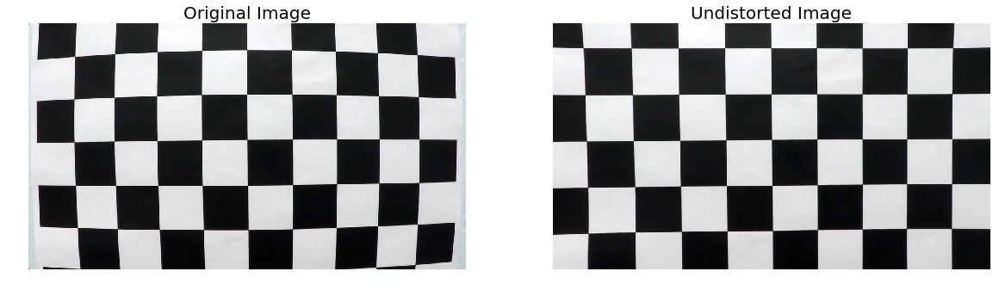

In [23]:
# Use camera matrix and distortion coefficients to undistort image
def undistort(image, mtx, dist):
    dst = cv2.undistort(image, mtx, dist, None, mtx)
    return dst

# Read a chessboard image and undistort it
raw_image = cv2.imread('camera_cal/calibration1.jpg')
undistorted_image = undistort(raw_image, mtx, dist)

# Display an original chessboard image and undistorted
f,(ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(raw_image)
ax1.set_title('Original Image', fontsize=20)
ax1.set_axis_off()
ax2.imshow(undistorted_image)
ax2.set_title('Undistorted Image', fontsize=20)
ax2.set_axis_off()
plt.show()

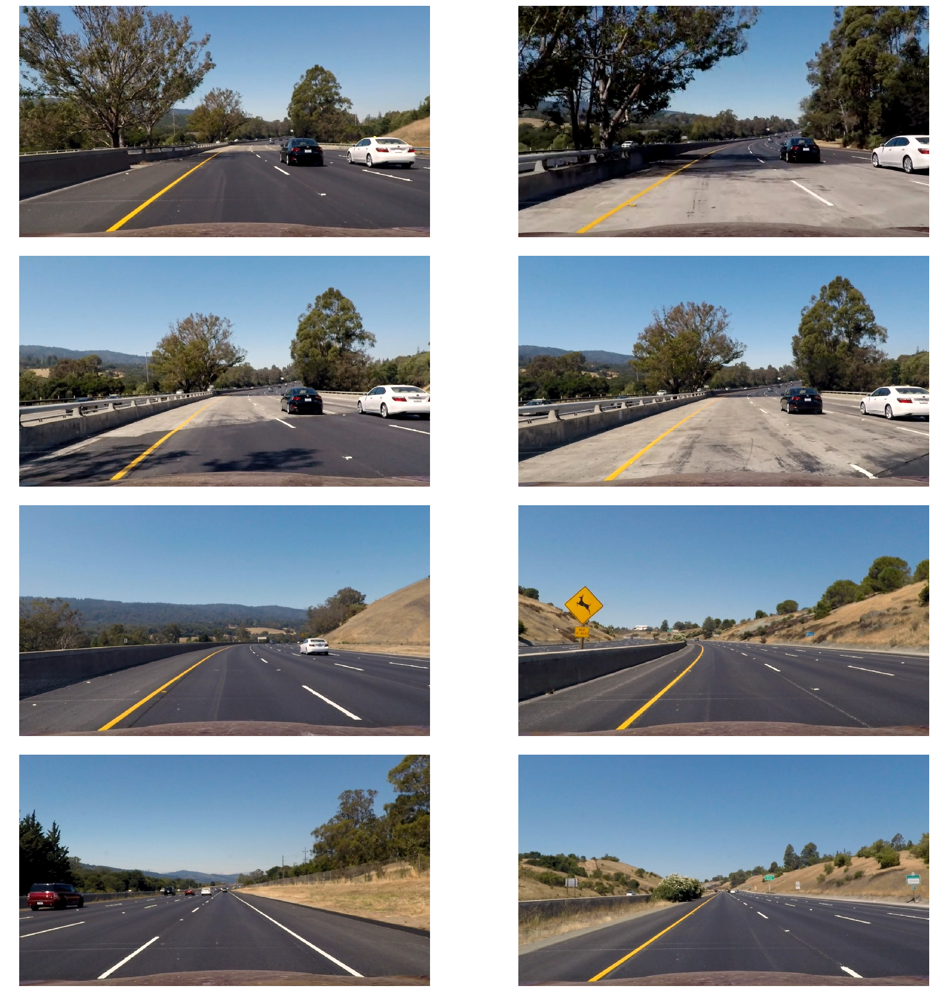

In [6]:
# Undistort test images
undistorted_images = []
for image in images:
    dst = undistort(image, mtx, dist)
    undistorted_images.append(dst)

imshow(undistorted_images)
plt.show()

## Use color transforms, gradients, etc., to create a thresholded binary image.
I used a combination of color and gradient thresholds to generate a binary image.
First I converted the image into grayscale and use Sobel Operator with 3x3 kernel size to calculate the derivative in x direction. Then I calculate the absolute value of the x derivative and converted it into 8-bit. After that I applied a binary threshold to select pixels based on the strength of x gradient.
I also converted the image into HLS space and seperated the S channel. Applying a binary threshold I got rid of pixels whose saturability value less than 130.
At last I combined the two binary thresholds.

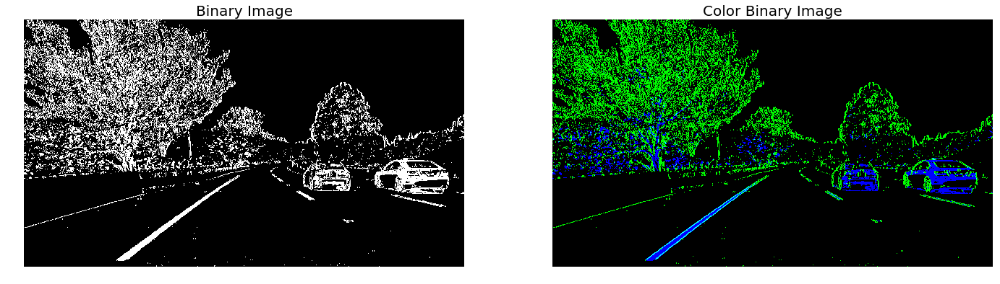

In [7]:
def binarize(image, sobel_kernel=3, sx_thresh=(20, 200), s_thresh=(130, 255)):
    """
    Input
    image: 3D image
    sobel_kernel: sobel operators kernel size
    sx_thresh: thresholds for gradient image
    s_thresh: thresholds for s channel image
    
    Output
    binary: the result of the two thresholds combined
    color_binary: a stack of the two binary images with different colors
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    s_channel = hls[:,:,2]
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    scaled_factor = np.max(abs_sobelx)/255
    scaled_sobel = np.uint8(abs_sobelx/scaled_factor)
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    sbinary = np.zeros_like(s_channel)
    sbinary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    binary = np.zeros_like(sbinary)
    binary[(sxbinary == 1) | (sbinary == 1)] = 1
    
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, sbinary))*255
    return binary, color_binary
    
img = undistorted_images[0]
binary, color_binary = binarize(img)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
ax1.imshow(binary, cmap='gray')
ax1.set_title('Binary Image', fontsize=20)
ax1.set_axis_off()
ax2.imshow(color_binary)
ax2.set_title('Color Binary Image', fontsize=20)
ax2.set_axis_off()
plt.show()

## Apply a perspective transform to rectify binary image ("birds-eye view").
I verified that my perspective transform was working as expected by drawing the `src` and `dst` points onto a test image and its warped counterpart to verify that the lines appear parallel in the warped image.

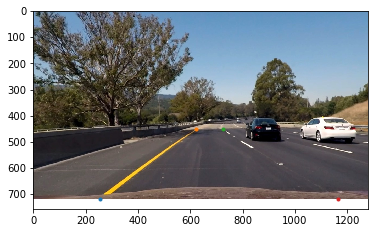

In [22]:
# Try locate source pionts of lane lines on a test image
img_sobel = undistorted_images[0]
plt.imshow(img_sobel, cmap='gray')
plt.plot(255, 720, '.')
plt.plot(620, 450, '.')
plt.plot(725, 450, '.')
plt.plot(1165, 720, '.')
plt.show()

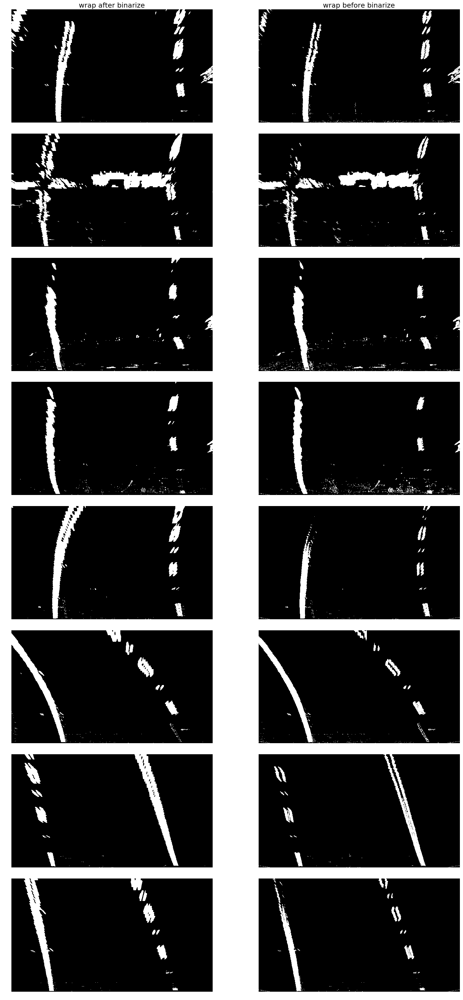

In [9]:
def warp(image):
    """
    Input
    src: the source points in the original image
    dst: the destination points in the image will be warped
    
    Output
    warped: the perspective transformed image
    unwarped: the original image transformed from warped
    """
    img_size = (image.shape[1], image.shape[0])
    src = np.float32([[255, 720],
                     [620, 450],
                     [725, 450],
                     [1165, 720]])
    
    dst = np.float32([[300, 720],
                     [300, 0],
                     [1100, 0],
                     [1100, 720]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
    unwarped = cv2.warpPerspective(image, Minv, img_size, flags=cv2.INTER_LINEAR)
    return warped, unwarped

# Try to process test images with warping and binarizing in different sequence and display the results
binarize_warped_images=[]
for image in undistorted_images:
    binary,_ = binarize(image)
    warped,_ = warp(binary)
    binarize_warped_images.append(warped)

warped_binarize_images=[]
for image in undistorted_images:
    warped,_ = warp(image)
    binary,_ = binarize(warped)    
    warped_binarize_images.append(binary)
    
f, axes = plt.subplots(len(images), 2, figsize=(20, 40))
f.tight_layout()
for i in range(len(images)):
    axes[i][0].imshow(binarize_warped_images[i], cmap='gray')
    axes[i][0].set_axis_off()
    axes[i][1].imshow(warped_binarize_images[i], cmap='gray')
    axes[i][1].set_axis_off()
axes[0][0].set_title('wrap after binarize', fontsize=20)
axes[0][1].set_title('wrap before binarize', fontsize=20)
plt.show()

There are less noisy points and stronger lane lines on the left images, so I choose wraping after binarizing.

## Detect lane pixels and fit to find the lane boundary.
First I find the two starting position for the left and right lane by using `np.sum` to get the vertical image slice and then  `np.convolve` the vertical image slice with the window template to find the best left and right window centroids. Based on the window centroids, I collected the nonzero pixel positions of left and right lane within the window. With the pixel positions, I fit a second order polynomial on each side using `np.polyfit` function and generate x, y values for plotting, calculating the curverature of the lane and vehicle postion.

In [10]:
def detect_lane_pixels(warped, win_w=50, win_h=80, margin=100):
    """
    Input:
    warped: a warped binary image
    win_w: width of sliding windows
    win_h: height of sliding windows
    margin: how much to slide left and right for searching
    
    Output: 
    leftx, lefty: the indices of left lane hot pixels, to fit a second order polynomial
    rightx, righty: the indices of right lane hot pixels
    """ 
    img_h, img_w = warped.shape
    window = np.ones(win_w)
    
    # Sum quarter bottom of image to get slice
    l_sum = np.sum(warped[int(3*img_h/4):, :int(img_w/2)], axis=0)
    l_center = np.argmax(np.convolve(window, l_sum)) - win_w/2
    r_sum = np.sum(warped[int(3*img_h/4):, int(img_w/2):], axis=0)
    r_center = np.argmax(np.convolve(window, r_sum)) - win_w/2 + int(img_w/2)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Go through each layer looking for max pixel locations
    for level in range((int)(img_h/win_h)):
        # Convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(img_h - (level+1)*win_h):int(img_h-level*win_h), :], axis=0)
        conv_signal = np.convolve(window, image_layer)
        
        # Find the best left and right centroid by using past left and right center as referance
        offset = win_w/2
        win_y_low = img_h - (level+1)*win_h
        win_y_high = img_h - level*win_h
        l_min_index = int(max(l_center+offset-margin, 0))
        l_max_index = int(min(l_center+offset+margin, img_w))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        
        r_min_index = int(max(r_center+offset-margin, 0))
        r_max_index = int(min(r_center+offset+margin, img_w))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        
        # Identify nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= l_min_index) & (nonzerox < l_max_index)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                          (nonzerox >= r_min_index) & (nonzerox < r_max_index)).nonzero()[0]  
        
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # exatract left and right lane pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    return leftx, lefty, rightx, righty

In [11]:
def fit_lane_line(warped, leftx, lefty, rightx, righty):
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    img_h = warped.shape[0]
    ploty = np.linspace(0, img_h-1, img_h)
    
    # Generate x and y values for plotting
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return ploty, left_fitx, right_fitx

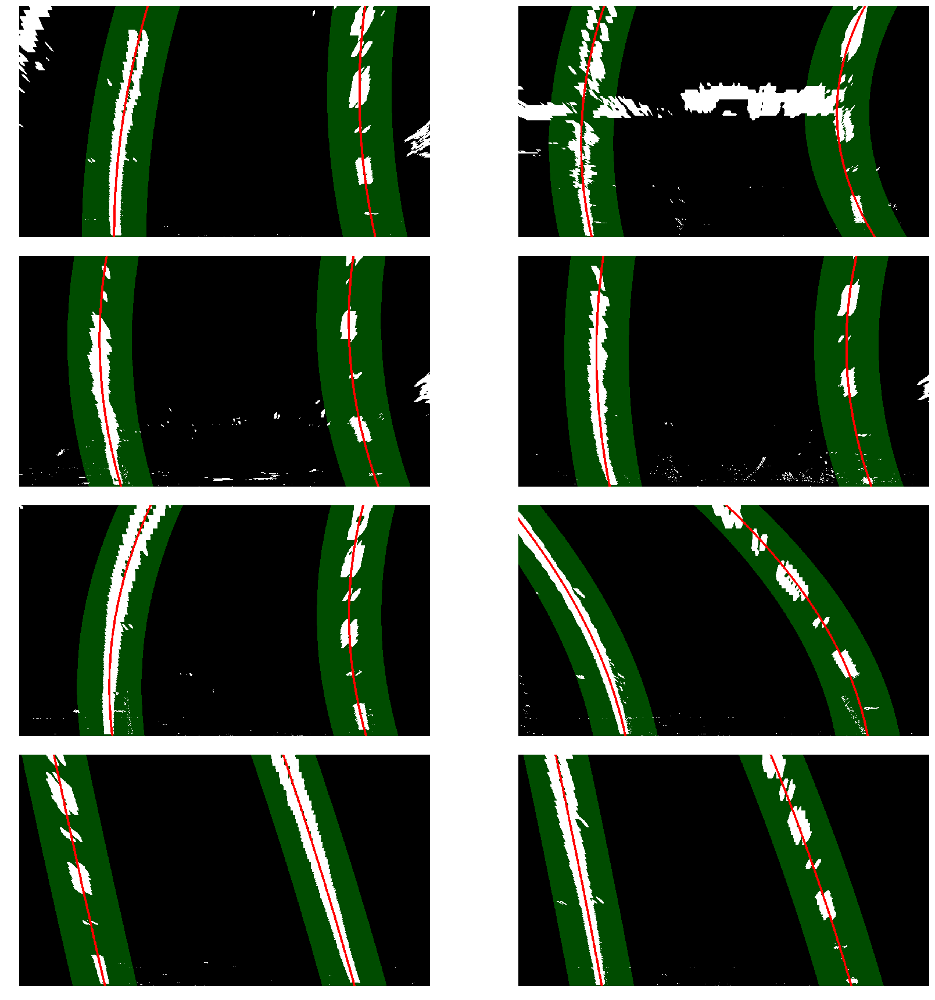

In [12]:
def draw_lane_lines_on_warped(warped, ploty, left_fitx, right_fitx, margin=100):
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((warped, warped, warped))*255
    window_img = np.zeros_like(out_img)
    
    # Generate a polygon to illustrate the search window area and recast the x and y points into usable format for cv2.fillpoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255,0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255,0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Generate a curve to draw the lane line
    left_pts = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    cv2.polylines(result, np.int_([left_pts]), False, (255,0,0), 5)
    
    right_pts = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    cv2.polylines(result, np.int_([right_pts]), False, (255,0,0), 5)
    return result

# Display the windows and lane lines on test images
warped_with_lane_lines = []
for warped in binarize_warped_images:
    leftx, lefty, rightx, righty = detect_lane_pixels(warped)
    ploty, left_fitx, right_fitx = fit_lane_line(warped, leftx, lefty, rightx, righty)
    result = draw_lane_lines_on_warped(warped, ploty, left_fitx, right_fitx)
    warped_with_lane_lines.append(result)

imshow(warped_with_lane_lines)
plt.show()  

## Determine the curvature of the lane and vehicle position with respect to center
Asuming the lane is about 30 meters long and 3.7 meters wide on the image. I convert the cordinates in world space and fit new polynomials to calcutlate the curvature of the lane based on the following equation:
$$ R_{curve} = \frac{(1+(2Ay+B)^2)^{3/2}}{|2A|}$$

I then calculate the x values of left and right lane on the bottom of the image using the new polynomials. After that I using the x values and the width of image  to calculate the vehice poistion. 

In [24]:
def measure_curvature(warped, ploty, leftx, lefty, rightx, righty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700
    img_h, img_w = warped.shape
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x, y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Calculate the new radii of curvatrue
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    curverad = (left_curverad/1000 + right_curverad/1000)/2
    
    # Calculate the vehicle position with respect to center
    leftx_eval = left_fit_cr[0]*(y_eval*ym_per_pix)**2 + left_fit_cr[1]*y_eval*ym_per_pix + left_fit_cr[2]
    rightx_eval = right_fit_cr[0]*(y_eval*ym_per_pix)**2 + right_fit_cr[1]*y_eval*ym_per_pix + right_fit_cr[2]
    off_center = (leftx_eval + rightx_eval)/2 - img_w/2 * xm_per_pix
    
    return round(curverad,2), round(off_center, 2) 

## Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position

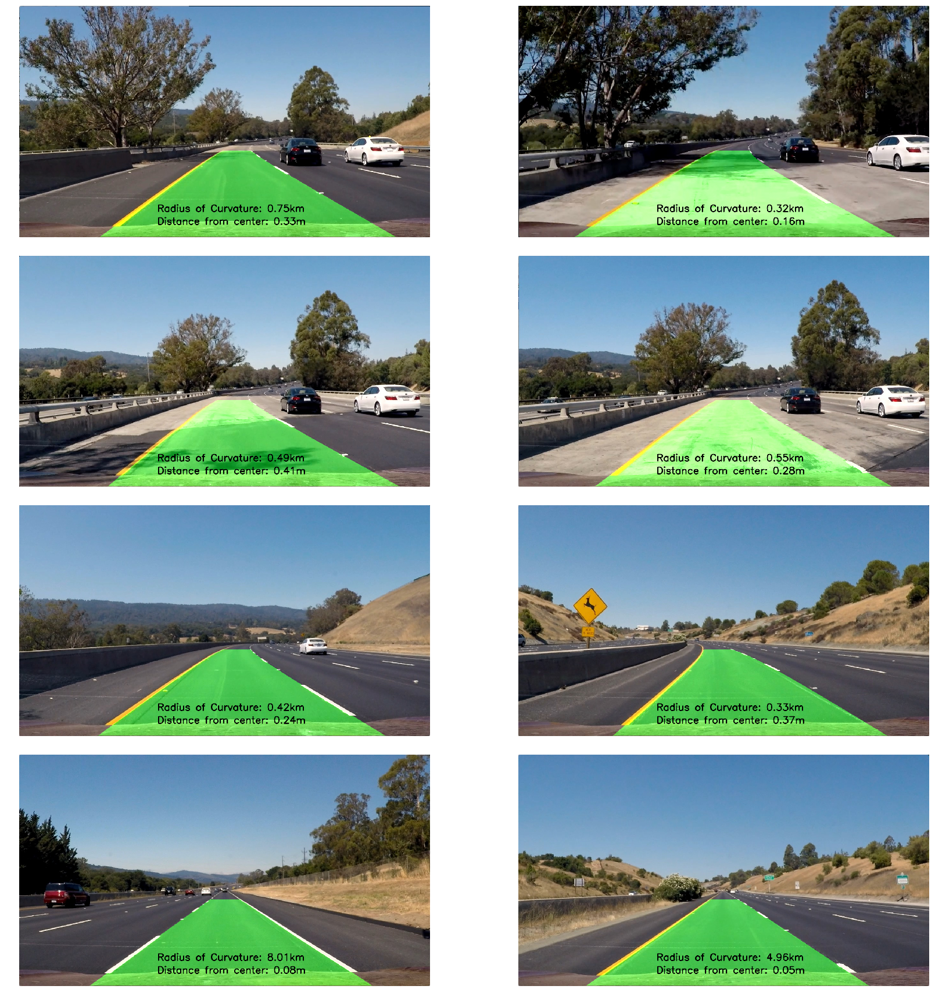

In [29]:
def draw_lane_boundaries_on_img(warped, image, ploty, left_fitx, right_fitx, curverad, off_center):
    # Create an image to draw on
    lane_boundaries = np.zeros_like(image)
    
    # Generate a polygon to illustrate the lane_boundaries
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    lane_boundaries = cv2.fillPoly(lane_boundaries, np.int_([pts]), (0,255,0))
    
    # Warp the detected lane boundaries back onto the original image.
    _, lane_boundaries = warp(lane_boundaries)
    
    # Draw the lane boundaries onto the original image
    result = cv2.addWeighted(image, 1, lane_boundaries, 0.5, 0)
    
    # Put the text of lane curvature and vehicle position on the original image
    radius_of_curvature = 'Radius of Curvature: ' + str(curverad) + 'km'
    result = cv2.putText(result, radius_of_curvature, (430,640), cv2.FONT_HERSHEY_SIMPLEX, 1, [0,0,0], 2, cv2.LINE_AA)
    distance_from_center = 'Distance from center: '+ str(off_center) + 'm'
    result = cv2.putText(result, distance_from_center, (430,680), cv2.FONT_HERSHEY_SIMPLEX, 1, [0,0,0], 2, cv2.LINE_AA)
    
    return result

# Display the lane boundaries and lane curvature and vehicle position on test images
img_with_lane_lines = []
for i in range(len(binarize_warped_images)):
    warped = binarize_warped_images[i]
    image = images[i]
    leftx, lefty, rightx, righty = detect_lane_pixels(warped)
    ploty, left_fitx, right_fitx = fit_lane_line(warped, leftx, lefty, rightx, righty)
    curverad, off_center = measure_curvature(warped, ploty, leftx, lefty, rightx, righty)
    result = draw_lane_boundaries_on_img(warped, image, ploty, left_fitx, right_fitx, curverad, off_center)
    img_with_lane_lines.append(result)
    # Save output images in output_images file
    path = 'output_images/' + 'test_image' + str(i) + '.jpg'
    plt.imsave(path, result)

imshow(img_with_lane_lines)
plt.show()    

In [15]:
# Define the processing pipeline
def process_image(image):
    undistorted = undistort(image, mtx, dist)
    binary,_ = binarize(undistorted)
    warped,_ = warp(binary)
    leftx, lefty, rightx, righty = detect_lane_pixels(warped)
    ploty, left_fitx, right_fitx = fit_lane_line(warped, leftx, lefty, rightx, righty)
    curverad, off_center = measure_curvature(warped, ploty, leftx, lefty, rightx, righty)
    result = draw_lane_boundaries_on_img(warped, image, ploty, left_fitx, right_fitx, curverad, off_center)
    return result

In [16]:
# Apply the procssing pipline to the project video
from moviepy.editor import VideoFileClip
from IPython.display import HTML

output1 = 'videos_output/project_video.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(output1, audio=False)

[MoviePy] >>>> Building video videos_output/project_video.mp4
[MoviePy] Writing video videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [02:15<00:00,  9.14it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos_output/project_video.mp4 

CPU times: user 3min 13s, sys: 22.2 s, total: 3min 35s
Wall time: 2min 16s


In [17]:
HTML("""
<video width="960" height="540" controls> <source src="{0}">
</video>
""".format(output1))

In [18]:
output2 = 'videos_output/challenge_video.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(output2, audio=False)

[MoviePy] >>>> Building video videos_output/challenge_video.mp4
[MoviePy] Writing video videos_output/challenge_video.mp4


100%|██████████| 485/485 [00:43<00:00, 10.91it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos_output/challenge_video.mp4 

CPU times: user 1min 8s, sys: 5.6 s, total: 1min 13s
Wall time: 44.8 s


In [19]:
HTML("""
<video width="960" height="540" controls> <source src="{0}">
</video>
""".format(output2))

In [20]:
output3 = 'videos_output/harder_challenge_video.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(output3, audio=False)

[MoviePy] >>>> Building video videos_output/harder_challenge_video.mp4
[MoviePy] Writing video videos_output/harder_challenge_video.mp4


100%|█████████▉| 1199/1200 [02:24<00:00,  8.93it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos_output/harder_challenge_video.mp4 

CPU times: user 3min 18s, sys: 21.2 s, total: 3min 40s
Wall time: 2min 26s


In [21]:
HTML("""
<video width="960" height="540" controls> <source src="{0}">
</video>
""".format(output3))

## Summerize
Most time the performance of pipeline on project video is good except some frames that driving under trees. On challenge video and harder challenge video, the performace is dispointed. When comes to dim lighting or high lighting area, it is hard to detect yellow or white lane lines.  I read this [post](https://medium.com/@kastsiukavets.alena/advanced-lane-lines-challenge-videos-try-20ac9e59a6ba) and tried to use the L CHANNEL as well, but the result didn't promote much.
